# Projeto Airbnb Rio - Ferramenta de Previsão de Preço de Imóvel para pessoas comuns 

### Objetivo

Construir um modelo de previsão de preço que permita uma pessoa comum que possui um imóvel possa saber quanto deve cobrar pela diária do seu imóvel.

Ou ainda, para o locador comum, dado o imóvel que ele está buscando, ajudar a saber se aquele imóvel está com preço atrativo (abaixo da média para imóveis com as mesmas características) ou não.

### Outras informações

As bases de dados foram retiradas do site kaggle: https://www.kaggle.com/allanbruno/airbnb-rio-de-janeiro

Inspirada na solução do usuário Allan Bruno do kaggle no Notebook: https://www.kaggle.com/allanbruno/helping-regular-people-price-listings-on-airbnb

### Importar Bibliotecas e Bases de Dados

In [1]:
import pandas as pd
import pathlib
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

In [2]:
meses = {'jan': 1, 'fev':2, 'mar':3, 'abr': 4, 'mai':5, 'jun': 6, 'jul': 7, 'ago': 8, 'set': 9, 'out': 10, 'nov': 11, 'dez': 12}

caminho_bases = pathlib.Path('dataset')

base_airbnb = pd.DataFrame()

# importar e consolidar bases
for arquivo in caminho_bases.iterdir():
    
    nome_mes = arquivo.name[:3]
    mes = meses[nome_mes]
    
    ano = arquivo.name[-8:]
    ano = int(ano.replace('.csv',''))
    
    df = pd.read_csv(caminho_bases / arquivo.name)
    df['ano'] = ano
    df['mes'] = mes
    base_airbnb = base_airbnb.append(df)

display(base_airbnb)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,number_of_reviews_ltm,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,14063,https://www.airbnb.com/rooms/14063,20180414160018,2018-04-14,Living in a Postcard,"Besides the most iconic's view, our apartment ...",NaN,"Besides the most iconic's view, our apartment ...",none,Best and favorite neighborhood of Rio. Perfect...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17878,https://www.airbnb.com/rooms/17878,20180414160018,2018-04-14,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,- large balcony which looks out on pedestrian ...,Please note that special rates apply for New Y...,none,This is the best spot in Rio. Everything happe...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,24480,https://www.airbnb.com/rooms/24480,20180414160018,2018-04-14,Nice and cozy near Ipanema Beach,My studio is located in the best of Ipanema. ...,The studio is located at Vinicius de Moraes St...,My studio is located in the best of Ipanema. ...,none,"The beach, the lagoon, Ipanema is a great loca...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,25026,https://www.airbnb.com/rooms/25026,20180414160018,2018-04-14,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,31560,https://www.airbnb.com/rooms/31560,20180414160018,2018-04-14,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,none,Die Nachbarschaft von Ipanema ist super lebend...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34324,38844730,https://www.airbnb.com/rooms/38844730,20190923212307,2019-09-24,TRANSAMERICA BARRA DA TIJUCA R IV,"Em estilo contemporâneo, o Transamerica Prime ...",NaN,"Em estilo contemporâneo, o Transamerica Prime ...",none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,15.0,0.0,0.0
34325,38846408,https://www.airbnb.com/rooms/38846408,20190923212307,2019-09-24,Alugo para o Rock in Rio,"Confortável apartamento, 2 quartos , sendo 1 s...",O apartamento estará com mobília completa disp...,"Confortável apartamento, 2 quartos , sendo 1 s...",none,"Muito próximo ao Parque Olímpico, local do eve...",...,2.0,2.0,1125.0,1125.0,2.0,1125.0,0.0,1.0,0.0,0.0
34326,38846703,https://www.airbnb.com/rooms/38846703,20190923212307,2019-09-24,Apt COMPLETO em COPACABANA c/TOTAL SEGURANÇA,Apartamento quarto e sala COMPLETO para curtas...,Espaço ideal para até 5 pessoas. Cama de casal...,Apartamento quarto e sala COMPLETO para curtas...,none,NaN,...,3.0,3.0,1125.0,1125.0,3.0,1125.0,0.0,23.0,6.0,0.0
34327,38847050,https://www.airbnb.com/rooms/38847050,20190923212307,2019-09-24,Cobertura Cinematografica,Cobertura alto nivel,NaN,Cobertura alto nivel,none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,1.0,0.0,0.0


### Se tivermos muitas colunas, já vamos identificar quais colunas podemos excluir

- Como temos muitas colunas, nosso modelo pode acabar ficando muito lento.
- Além disso, uma análise rápida permite ver que várias colunas não são necessárias para o nosso modelo de previsão, por isso, vamos excluir algumas colunas da nossa base
- Tipos de colunas que vamos excluir:
    1. IDs, Links e informações não relevantes para o modelo
    2. Colunas repetidas ou extremamente parecidas com outra (que dão a mesma informação para o modelo. Ex: Data x Ano/Mês
    3. Colunas preenchidas com texto livre -> Não rodaremos nenhuma análise de palavras ou algo do tipo
    4. Colunas em que todos ou quase todos os valores são iguais
    
- Para isso, vamos criar um arquivo em excel com os 1.000 primeiros registros e fazer uma análise qualitativa, olhando as colunas e identificando quais são desnecessárias

In [3]:
# ver nome de todas as colunas
print(list(base_airbnb.columns))

# gerar excel
base_airbnb.head(1000).to_csv('primeiros_registros.csv',sep=';')

['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary', 'space', 'description', 'experiences_offered', 'neighborhood_overview', 'notes', 'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'street', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market', 'smart_location', 'country_code', 'country', 'latitude', 'longitude', 'is_location_exact', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'square_feet', 'price', 'weekly_price', 'monthly_price', '

In [4]:
print(base_airbnb[['experiences_offered']].value_counts())

print(base_airbnb[['host_acceptance_rate']].value_counts())

experiences_offered
none                   902210
dtype: int64
host_acceptance_rate
100%                    31697
0%                       4744
50%                      3781
99%                      3320
67%                      3140
                        ...  
16%                        22
15%                        21
7%                         20
51%                        18
6%                         11
Length: 100, dtype: int64


In [5]:
print((base_airbnb['host_total_listings_count']==base_airbnb['host_listings_count']).value_counts())

True     901750
False       460
dtype: int64


In [6]:
print(base_airbnb['square_feet'].isnull().sum())

# decidimos corte de 50% valores nulos, exclui coluna

888162


### Depois da análise qualitativa das colunas, levando em conta os critérios explicados acima, ficamos com as seguintes colunas:

In [7]:
colunas = ['host_response_time','host_response_rate','host_is_superhost','host_listings_count','latitude','longitude','property_type','room_type','accommodates','bathrooms','bedrooms','beds','bed_type','amenities','price','security_deposit','cleaning_fee','guests_included','extra_people','minimum_nights','maximum_nights','number_of_reviews','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','instant_bookable','is_business_travel_ready','cancellation_policy','ano','mes'
]
base_airbnb = base_airbnb.loc[:,colunas]
display(base_airbnb)

,host_response_time,host_response_rate,host_is_superhost,host_listings_count,latitude,longitude,property_type,room_type,accommodates,bathrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,is_business_travel_ready,cancellation_policy,ano,mes
0,NaN,NaN,f,1.0,-22.946854,-43.182737,Apartment,Entire home/apt,4,1.0,...,9.0,9.0,9.0,9.0,9.0,f,f,strict_14_with_grace_period,2018,4
1,within an hour,100%,t,2.0,-22.965919,-43.178962,Condominium,Entire home/apt,5,1.0,...,9.0,10.0,10.0,9.0,9.0,t,f,strict,2018,4
2,within an hour,100%,f,1.0,-22.985698,-43.201935,Apartment,Entire home/apt,2,1.0,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
3,within an hour,100%,f,3.0,-22.977117,-43.190454,Apartment,Entire home/apt,3,1.0,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
4,within an hour,100%,t,1.0,-22.983024,-43.214270,Apartment,Entire home/apt,3,1.0,...,10.0,10.0,10.0,10.0,9.0,t,f,strict,2018,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34324,within an hour,93%,f,0.0,-23.003180,-43.342840,Apartment,Entire home/apt,4,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,2019,9
34325,NaN,NaN,f,0.0,-22.966640,-43.393450,Apartment,Entire home/apt,4,2.0,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,2019,9
34326,within a few hours,74%,f,32.0,-22.962080,-43.175520,Apartment,Entire home/apt,5,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2019,9
34327,NaN,NaN,f,0.0,-23.003400,-43.341820,Apartment,Entire home/apt,4,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2019,9


### Tratar Valores Faltando

- Visualizando os dados percebemos que existe uma grande disparidade em dados faltantes. As colunas com mais de 300 mil valores NaN foram excluídas da análise,
- Para outras colunas, como temos muitos dados (mais de 900 mil linhas), vamos excluir linhas que contém dados NaN

In [8]:
# excluir colunas acima de 300 mil NaN
for coluna in base_airbnb:
    if base_airbnb[coluna].isnull().sum() > 300000:
        base_airbnb = base_airbnb.drop(coluna, axis=1)

print(base_airbnb.isnull().sum())
print(base_airbnb.shape)

host_is_superhost            460
host_listings_count          460
latitude                       0
longitude                      0
property_type                  0
room_type                      0
accommodates                   0
bathrooms                   1724
bedrooms                     850
beds                        2502
bed_type                       0
amenities                      0
price                          0
guests_included                0
extra_people                   0
minimum_nights                 0
maximum_nights                 0
number_of_reviews              0
instant_bookable               0
is_business_travel_ready       0
cancellation_policy            0
ano                            0
mes                            0
dtype: int64
(902210, 23)


In [9]:
# deletar linhas com NaN
base_airbnb = base_airbnb.dropna() 
print(base_airbnb.shape)

(897709, 23)


### Verificar Tipos de Dados em cada coluna

In [10]:
# ver tipo de informação em cada coluna
print(base_airbnb.dtypes)
print('-'*60)
print(base_airbnb.iloc[0])

# obs: texto é reconhecido como object

host_is_superhost            object
host_listings_count         float64
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                        object
guests_included               int64
extra_people                 object
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
ano                           int64
mes                           int64
dtype: object
------------------------------------------------------------
host_is_superhost                                                           f
host_listings_count

- Como preço e extra_people estão sendo reconhecidos como objeto (ao invés de ser um float) temos que mudar o tipo de variável da coluna

- Obs: quando tiver muita informação no df, é melhor transformar para float32 (ao invés de float64) pois a leitura do código fica mais ágil por ocupar menos memória

In [11]:
# price = float
base_airbnb['price'] = base_airbnb['price'].str.replace('$','')
base_airbnb['price'] = base_airbnb['price'].str.replace(',','')
base_airbnb['price'] = base_airbnb['price'].astype(np.float32, copy=False) # transformar type

# extra_people = float
base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace('$','')
base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace(',','')
base_airbnb['extra_people'] = base_airbnb['extra_people'].astype(np.float32, copy=False)

# verificando tipos
print(base_airbnb.dtypes)

# sobre o aviso que aparece ver esse link:
# https://paulovasconcellos.com.br/o-que-%C3%A9-a-value-is-trying-to-be-set-on-a-copy-of-a-slice-from-a-dataframe-e85f744d8be1

host_is_superhost            object
host_listings_count         float64
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                       float32
guests_included               int64
extra_people                float32
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
ano                           int64
mes                           int64
dtype: object


### Análise Exploratória e Tratar Outliers

<AxesSubplot: >

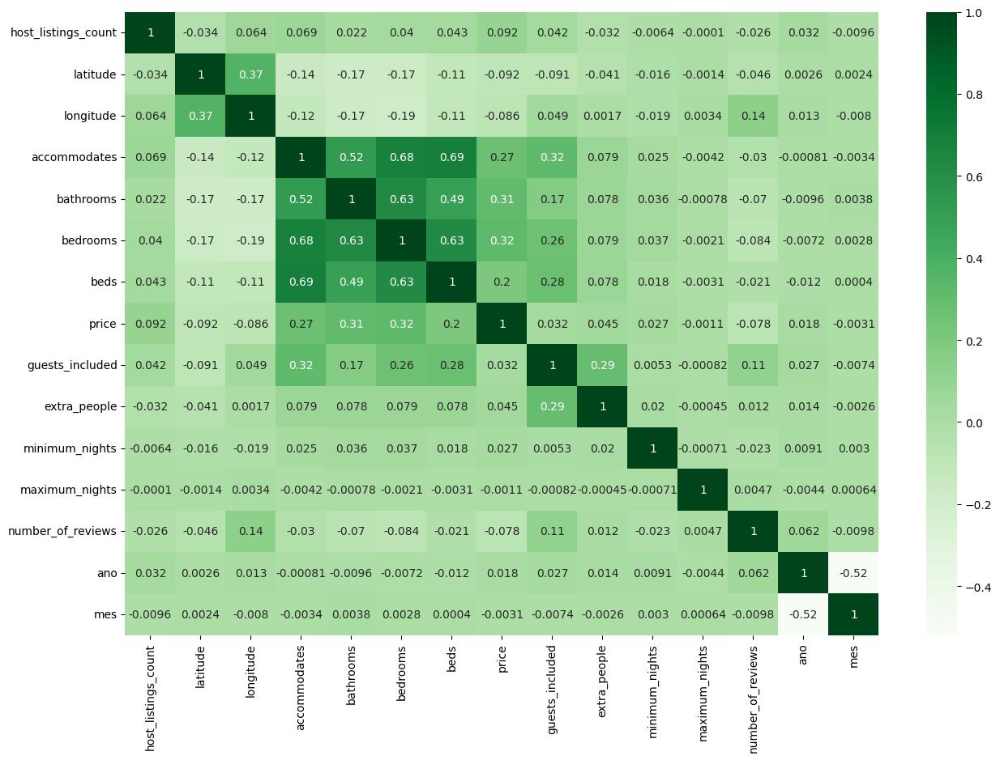

In [12]:
# correlação
plt.figure(figsize=(15,10))
sns.heatmap(base_airbnb.corr(),annot=True, cmap='Greens')
# annot=True -> fornecer descrição

Correlação vai de -1 a 1
- -1 é uma correlação negativa muito forte
- 1 é uma corr poitiva muito forte
- em torno de zero é corr fraca


No caso da nossa base de dados:
- Não encontramos colunas com corr muito forte e que podem dizer a mesma coisa no modelo (e aí avaliaríams tirar uma delas)
- Por isso vamos manter todas as colunas


### Definição de Funções para Análise de Outliers

In [13]:
# limites superior e inferior
def limites(coluna):
    q1 = coluna.quantile(0.25) # passa valor na 25 posicao
    q3 = coluna.quantile(0.75)
    amplitude = q3-q1
    return q1-1.5*amplitude, q3+1.5*amplitude # retorna tupla

# excluir outliers do df e contar linhas excluídas
def excluir_outliers(df, nome_coluna):
    qtde_linhas = df.shape[0]
    lim_inf, lim_sup = limites(df[nome_coluna])
    df = df.loc[(df[nome_coluna]>=lim_inf) & (df[nome_coluna]<=lim_sup),:]
    linhas_removidas = qtde_linhas - df.shape[0]
    return df, linhas_removidas

In [14]:
# teste limites()
print(limites(base_airbnb['price']))
base_airbnb['price'].describe()

(-524.0, 1276.0)


count    897709.000000
mean        647.922241
std        1705.104980
min           0.000000
25%         151.000000
50%         297.000000
75%         601.000000
max      138288.000000
Name: price, dtype: float64

In [15]:
# exibir graficos de caixa com limites

def diagrama_caixa(coluna):
    fig, (ax1, ax2) = plt.subplots(1,2) # 1 linha, 2 colunas
    fig.set_size_inches(15,5)
    sns.boxplot(x=coluna, ax=ax1)
    ax2.set_xlim(limites(coluna))
    sns.boxplot(x=coluna, ax=ax2)

def histograma(coluna):
    plt.figure(figsize=(15,5))
    sns.distplot(coluna,hist=True)

def grafico_barra(coluna):
    plt.figure(figsize=(15,5))
    ax = sns.barplot(x=coluna.value_counts().index, y=coluna.value_counts())
    ax.set_xlim(limites(coluna))

In [16]:
# teste diagrama_caixa()
#diagrama_caixa(base_airbnb['price'])
#histograma(base_airbnb['price'])

### Análise das colunas

### price

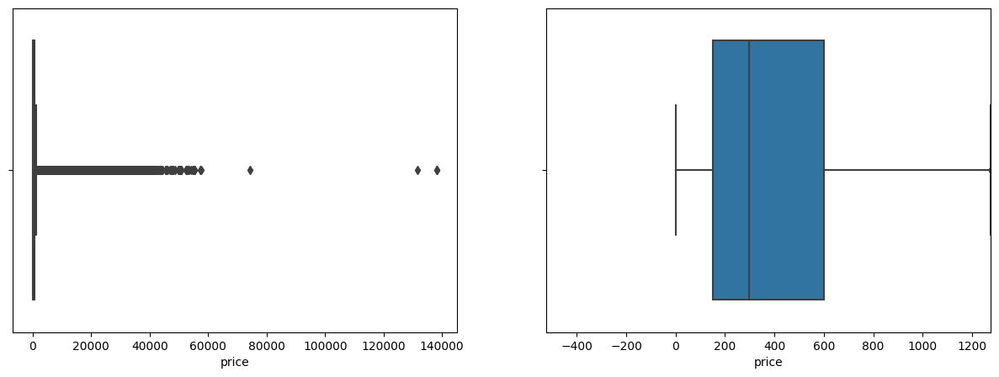

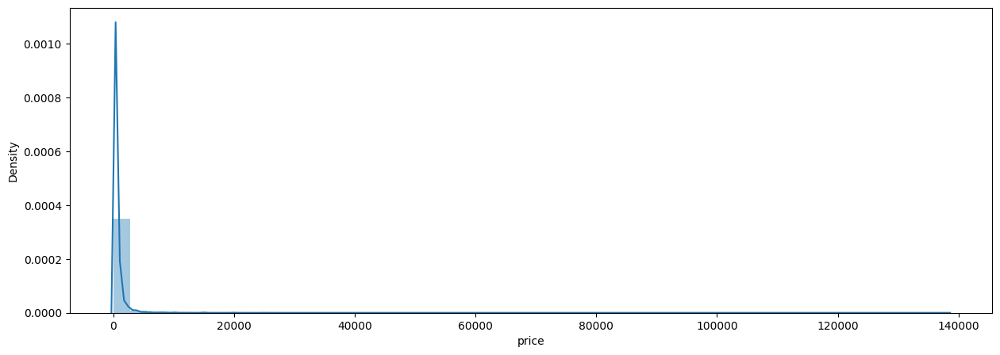

In [17]:
diagrama_caixa(base_airbnb['price'])
histograma(base_airbnb['price'])

In [18]:
# excluindo outliers
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb,'price')
print('{} linhas removidas'.format(linhas_removidas))

# excluidas cerca de 10% das linhas 

87282 linhas removidas


(810427, 23)


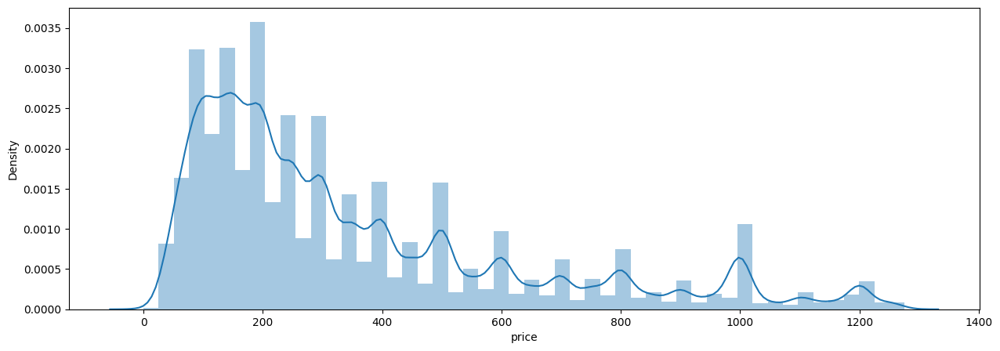

In [19]:
print(base_airbnb.shape)
histograma(base_airbnb['price'])
# tem mais imóveis com preços cheios

### extra_people

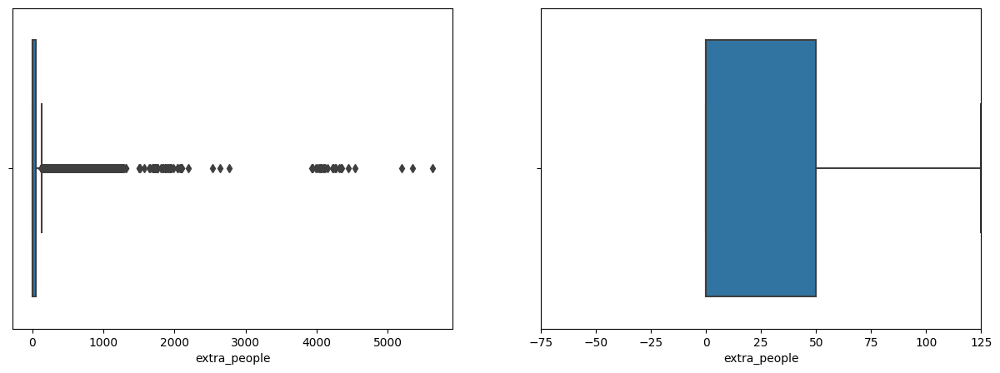

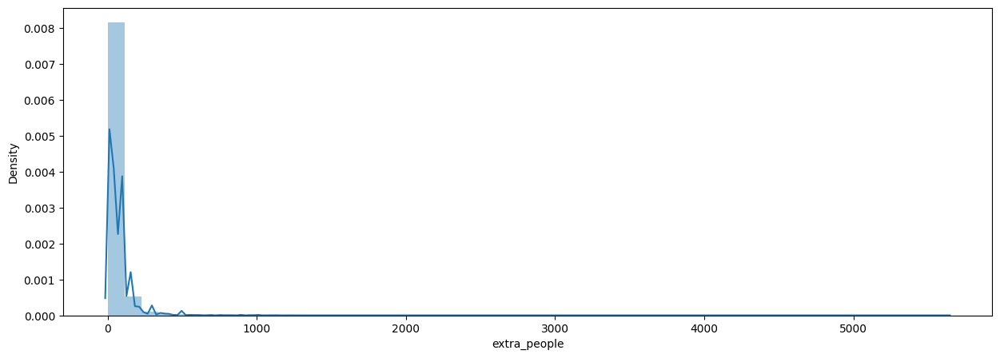

In [20]:
diagrama_caixa(base_airbnb['extra_people'])
histograma(base_airbnb['extra_people'])

In [21]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb,'extra_people')
print('{} linhas removidas'.format(linhas_removidas))

59194 linhas removidas


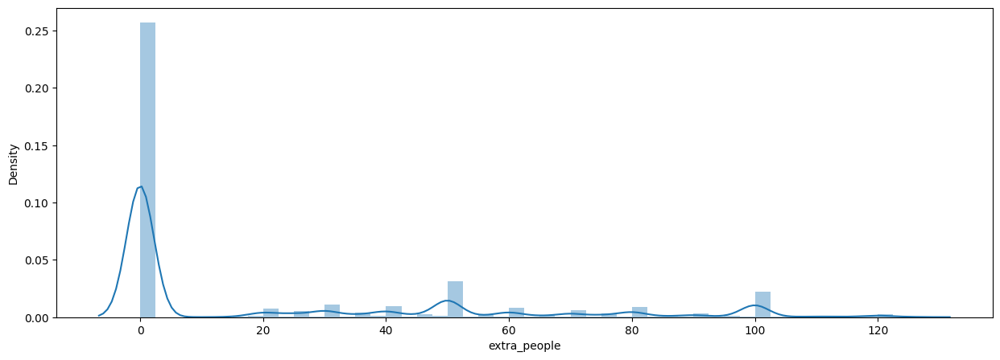

In [22]:
histograma(base_airbnb['extra_people'])

Lista de colunas com números inteiros

- host_listings_count
- accommodates
- bathrooms
- bedrooms
- beds
- guests_included
- minimum_nights
- maximum_nights
- number_of_reviews

### host_listings_count

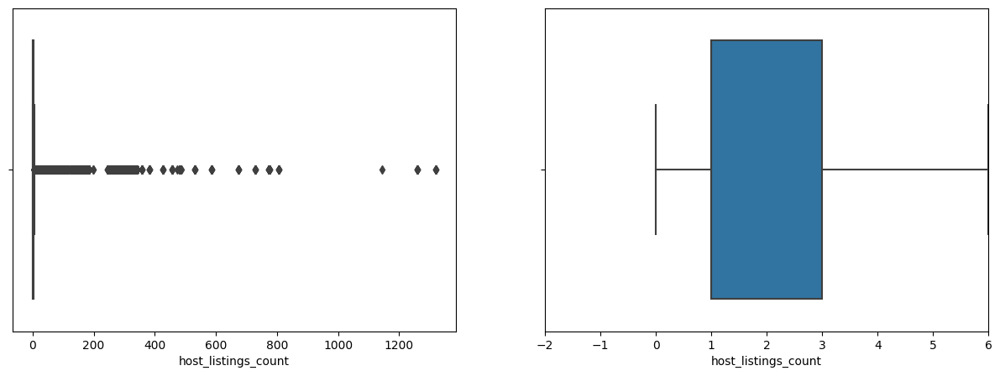

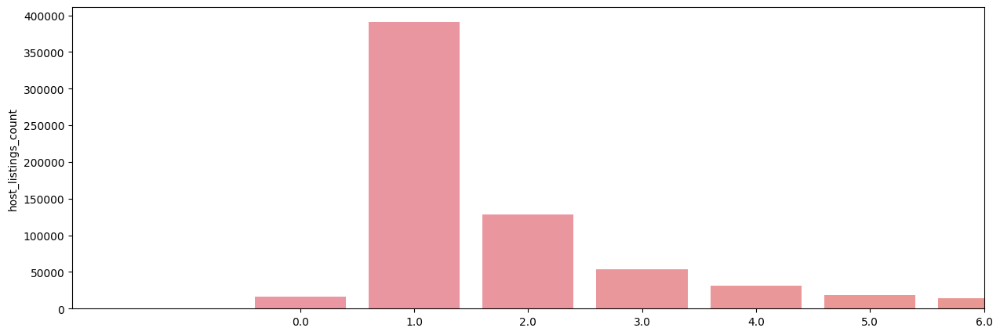

In [23]:
diagrama_caixa(base_airbnb['host_listings_count'])
grafico_barra(base_airbnb['host_listings_count'])

In [24]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb,'host_listings_count')
print('{} linhas removidas'.format(linhas_removidas))

97723 linhas removidas


### accommodates

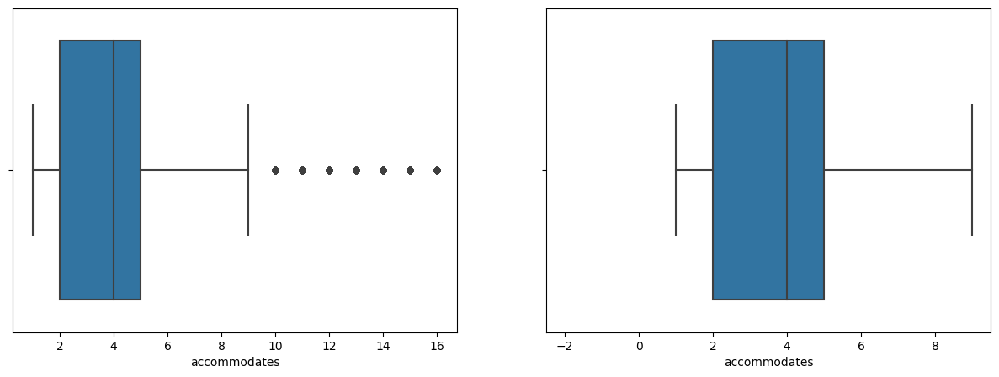

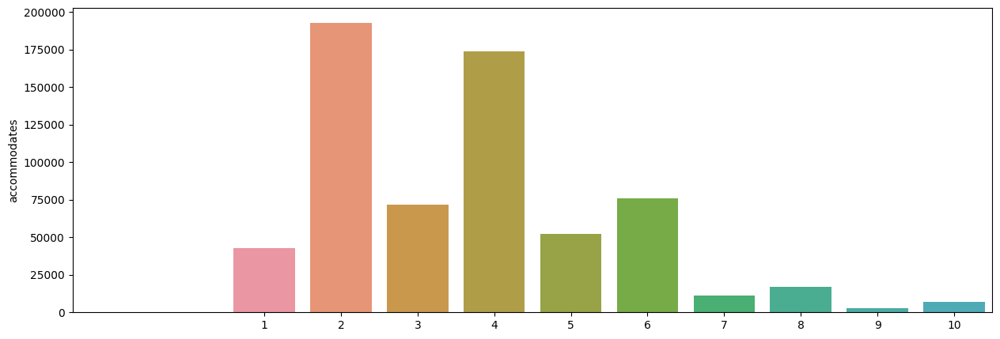

In [25]:
diagrama_caixa(base_airbnb['accommodates'])
grafico_barra(base_airbnb['accommodates'])

In [26]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb,'accommodates')
print('{} linhas removidas'.format(linhas_removidas))

13146 linhas removidas


### bathrooms

<AxesSubplot: ylabel='bathrooms'>

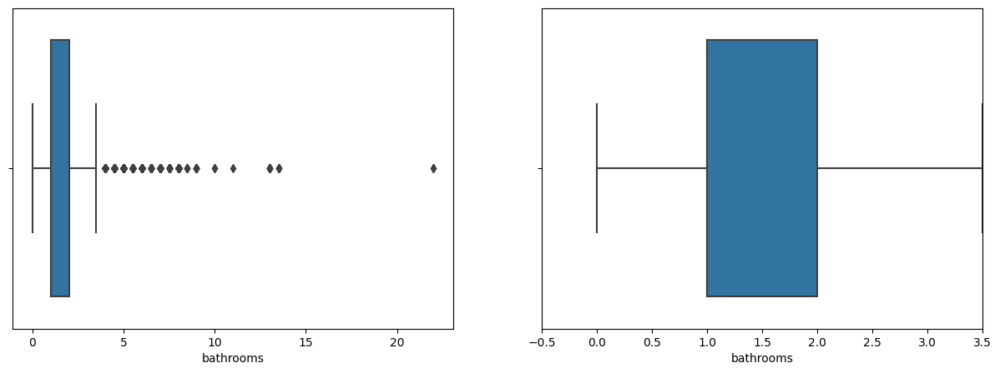

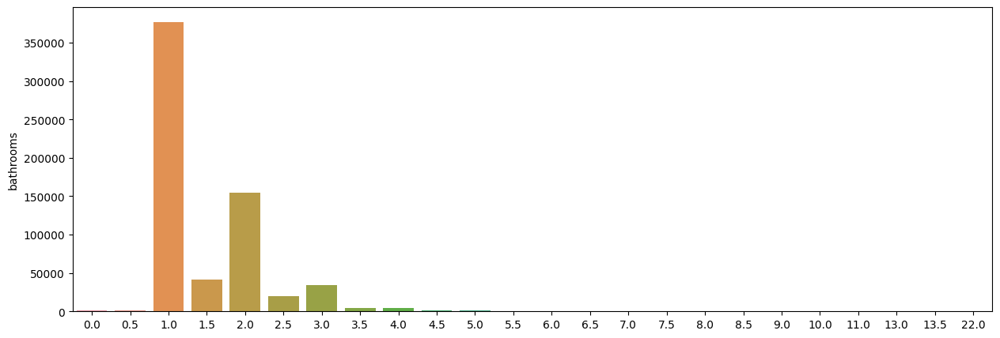

In [27]:
diagrama_caixa(base_airbnb['bathrooms'])
plt.figure(figsize=(15,5))
sns.barplot(x=base_airbnb['bathrooms'].value_counts().index,
            y=base_airbnb['bathrooms'].value_counts())

In [28]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb,'bathrooms')
print('{} linhas removidas'.format(linhas_removidas))

6894 linhas removidas


### bedrooms

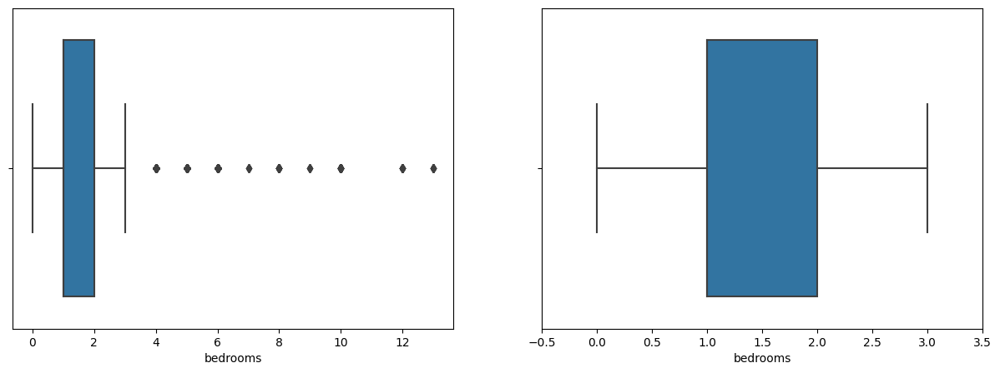

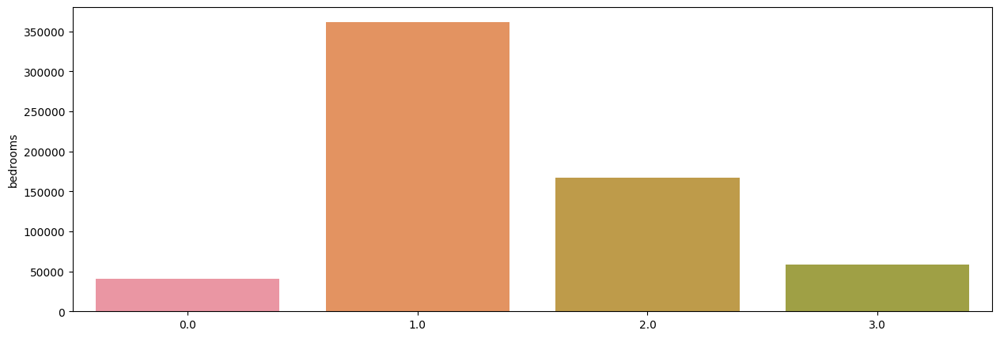

In [29]:
diagrama_caixa(base_airbnb['bedrooms'])
grafico_barra(base_airbnb['bedrooms'])

In [30]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb,'bedrooms')
print('{} linhas removidas'.format(linhas_removidas))

5482 linhas removidas


### beds

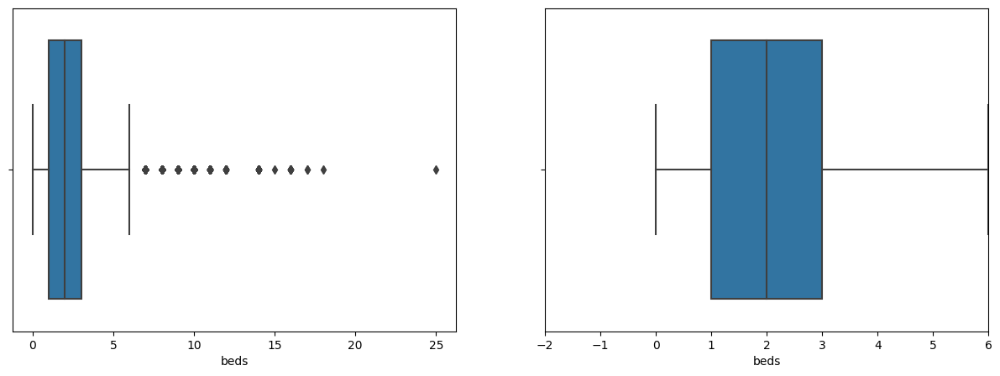

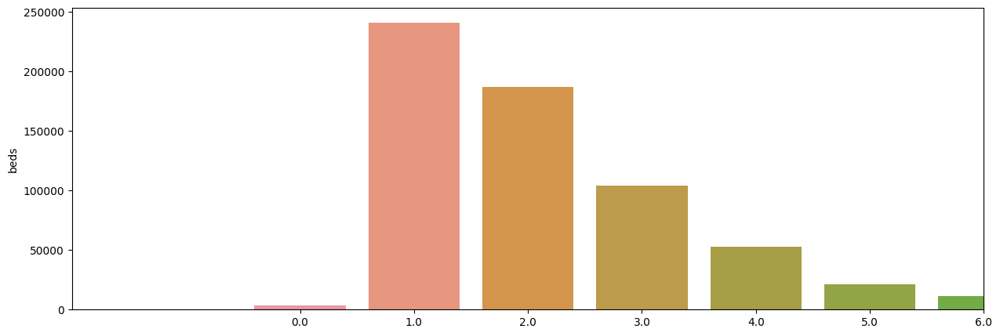

In [31]:
diagrama_caixa(base_airbnb['beds'])
grafico_barra(base_airbnb['beds'])

In [32]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb,'beds')
print('{} linhas removidas'.format(linhas_removidas))

5622 linhas removidas


### guests_included

(1.0, 1.0)


<AxesSubplot: ylabel='guests_included'>

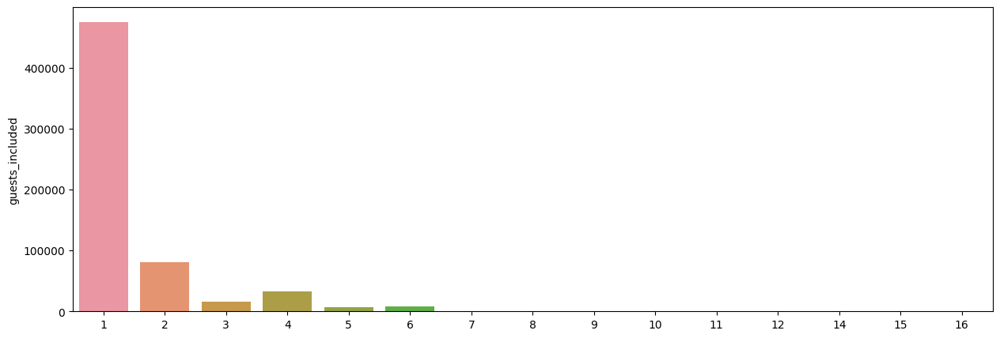

In [33]:
#diagrama_caixa(base_airbnb['guests_included'])
#grafico_barra(base_airbnb['guests_included'])

print(limites(base_airbnb['guests_included'])) # limites identicos

plt.figure(figsize=(15,5))
sns.barplot(x=base_airbnb['guests_included'].value_counts().index,
            y=base_airbnb['guests_included'].value_counts())

# parece ter algum erro de preenchimento

In [34]:
# excluir coluna
base_airbnb = base_airbnb.drop('guests_included', axis=1)
base_airbnb.shape

(622366, 22)

### minimum_nights

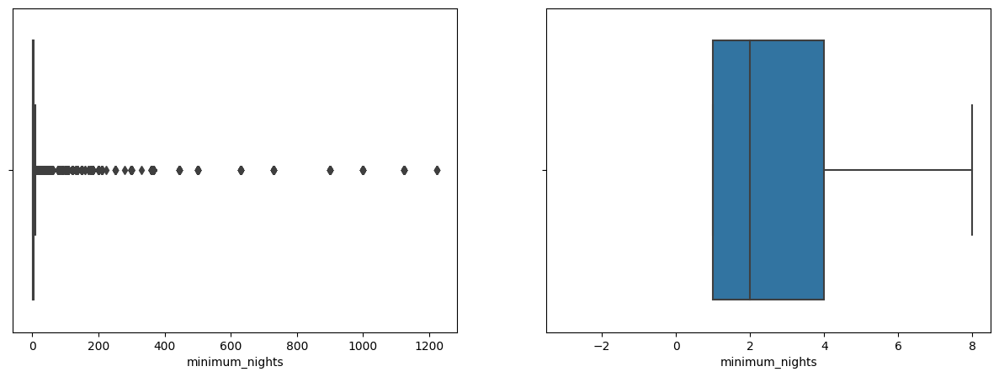

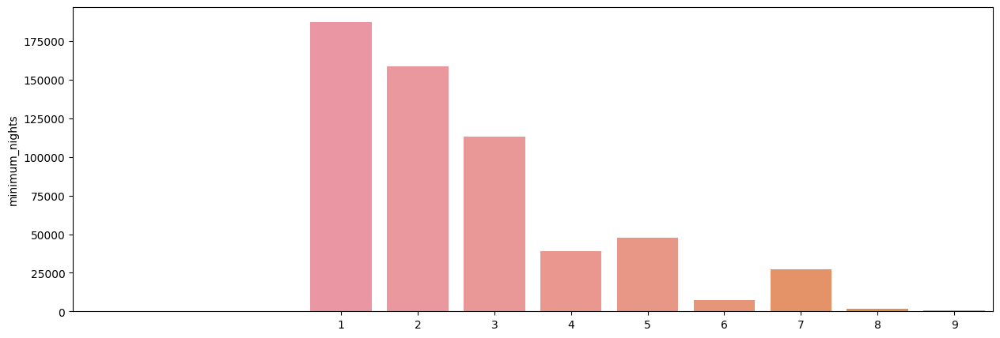

In [35]:
diagrama_caixa(base_airbnb['minimum_nights'])
grafico_barra(base_airbnb['minimum_nights'])

In [36]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb,'minimum_nights')
print('{} linhas removidas'.format(linhas_removidas))

40383 linhas removidas


### maximum_nights

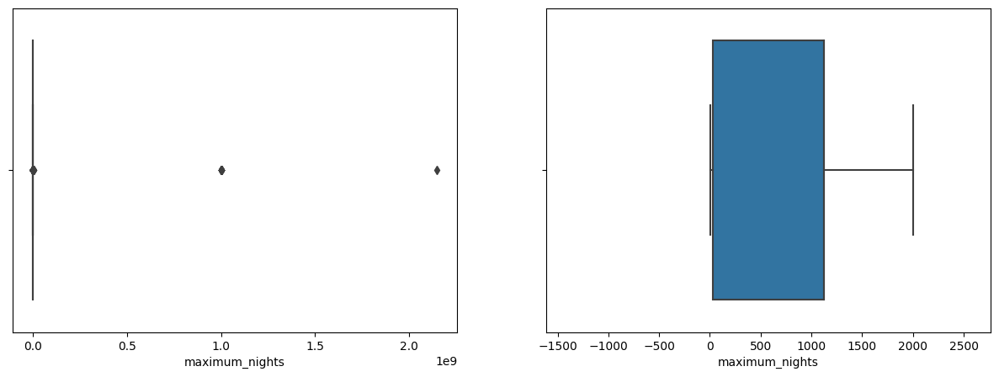

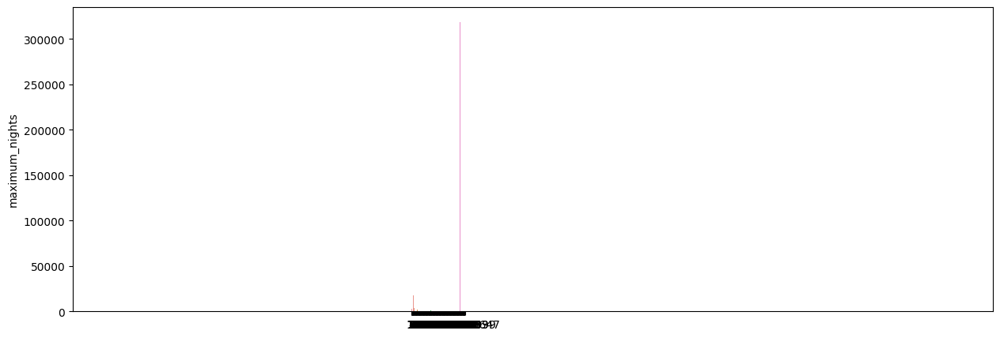

In [37]:
diagrama_caixa(base_airbnb['maximum_nights'])
grafico_barra(base_airbnb['maximum_nights'])

In [38]:
# excluir coluna
base_airbnb = base_airbnb.drop('maximum_nights', axis=1)
base_airbnb.shape

(581983, 21)

### number_of_reviews

- Não sabemos se vai impactar no preço;
- Problema em tirar hosts acima de 15 reviews: pode prejudicar (pode retirar os melhores hosts da análise);
- Optamos por retirar da análise, pois o objetivo é ajudar alguem que não tem reviews e quer disponibilizar seu imóvel e saber quanto cobrar. Ou seja, queremos criar um modelo em que o preço não dependa do numero de reviews.


- Além, disso: modelos mais simples são preferíveis.

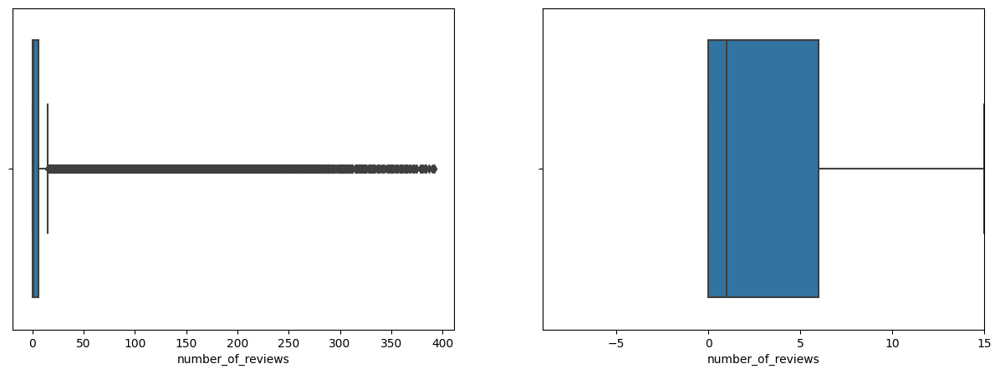

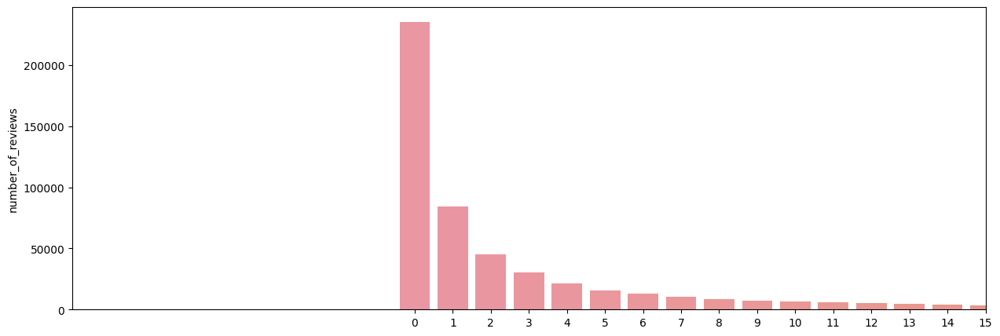

In [39]:
diagrama_caixa(base_airbnb['number_of_reviews'])
grafico_barra(base_airbnb['number_of_reviews'])

In [40]:
# excluir coluna
base_airbnb = base_airbnb.drop('number_of_reviews', axis=1)
base_airbnb.shape

(581983, 20)

### Tratamento de Colunas de Valores de Texto

### property_type

Apartment                 458354
House                      51387
Condominium                26456
Serviced apartment         12671
Loft                       12352
Guest suite                 3621
Bed and breakfast           3472
Hostel                      2665
Guesthouse                  2155
Other                       1957
Villa                       1294
Townhouse                    969
Aparthotel                   693
Chalet                       481
Earth house                  468
Tiny house                   457
Boutique hotel               447
Hotel                        376
Casa particular (Cuba)       298
Cottage                      230
Bungalow                     207
Dorm                         185
Cabin                        141
Nature lodge                 124
Castle                        80
Treehouse                     76
Island                        54
Boat                          53
Hut                           40
Campsite                      34
Resort    

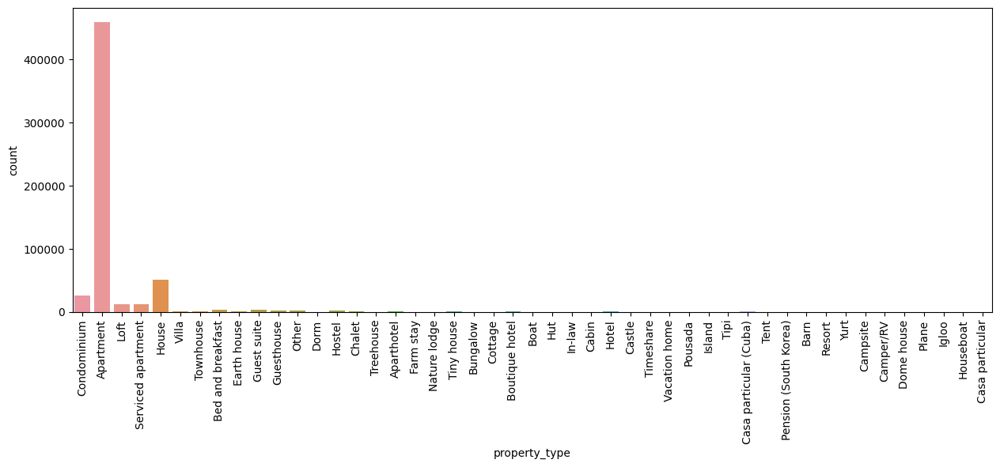

In [41]:
print(base_airbnb['property_type'].value_counts())

plt.figure(figsize=(15,5))
grafico = sns.countplot(x='property_type',data=base_airbnb)
grafico.tick_params(axis='x',rotation=90)

Index(['Apartment', 'House', 'Condominium', 'Serviced apartment', 'Loft',
       'Guest suite', 'Bed and breakfast', 'Hostel', 'Guesthouse', 'Other',
       'Villa', 'Townhouse', 'Aparthotel', 'Chalet', 'Earth house',
       'Tiny house', 'Boutique hotel', 'Hotel', 'Casa particular (Cuba)',
       'Cottage', 'Bungalow', 'Dorm', 'Cabin', 'Nature lodge', 'Castle',
       'Treehouse', 'Island', 'Boat', 'Hut', 'Campsite', 'Resort', 'Camper/RV',
       'Yurt', 'Tent', 'Tipi', 'Barn', 'Farm stay', 'Pension (South Korea)',
       'Dome house', 'Igloo', 'In-law', 'Vacation home', 'Timeshare',
       'Pousada', 'Houseboat', 'Casa particular', 'Plane'],
      dtype='object')
['Other', 'Villa', 'Townhouse', 'Aparthotel', 'Chalet', 'Earth house', 'Tiny house', 'Boutique hotel', 'Hotel', 'Casa particular (Cuba)', 'Cottage', 'Bungalow', 'Dorm', 'Cabin', 'Nature lodge', 'Castle', 'Treehouse', 'Island', 'Boat', 'Hut', 'Campsite', 'Resort', 'Camper/RV', 'Yurt', 'Tent', 'Tipi', 'Barn', 'Farm stay', 'Pen

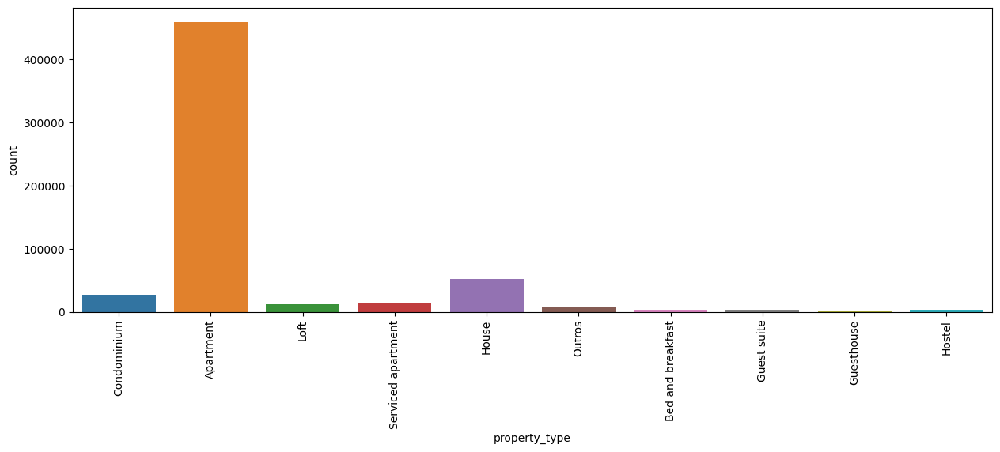

In [42]:
# agrupar categorias abaixo 2000 em 'Outros'
tabela_tipos_casa = base_airbnb['property_type'].value_counts()
print(tabela_tipos_casa.index) # lista de casas

colunas_agrupar = []
for tipo in tabela_tipos_casa.index:
    if tabela_tipos_casa[tipo] < 2000:
        colunas_agrupar.append(tipo)
print(colunas_agrupar) # lista que vamos considerar 'Outros'

for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['property_type']==tipo,'property_type'] = 'Outros'

print(base_airbnb['property_type'].value_counts())
plt.figure(figsize=(15,5))
grafico = sns.countplot(x='property_type',data=base_airbnb)
grafico.tick_params(axis='x',rotation=90)

### room_type

Entire home/apt    372443
Private room       196859
Shared room         11714
Hotel room            967
Name: room_type, dtype: int64


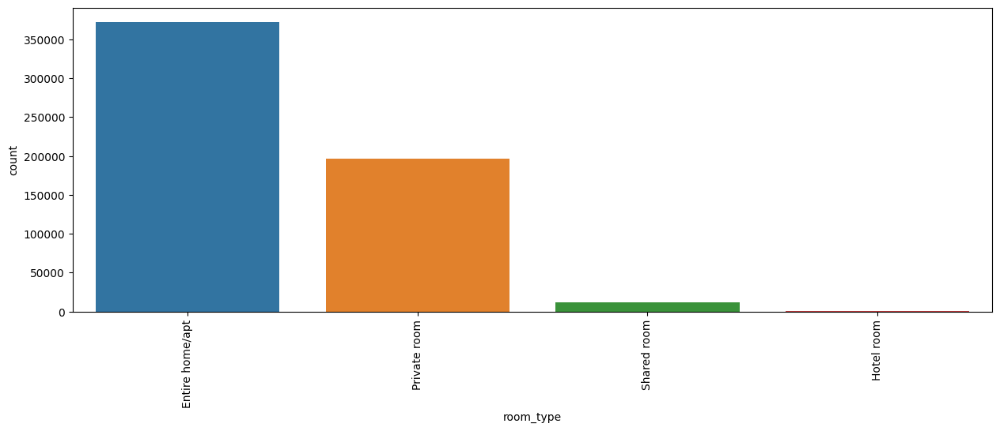

In [43]:
print(base_airbnb['room_type'].value_counts())

plt.figure(figsize=(15,5))
grafico = sns.countplot(x='room_type',data=base_airbnb)
grafico.tick_params(axis='x',rotation=90)

### bed_type

Real Bed         570643
Pull-out Sofa      8055
Futon              1634
Airbed             1155
Couch               496
Name: bed_type, dtype: int64


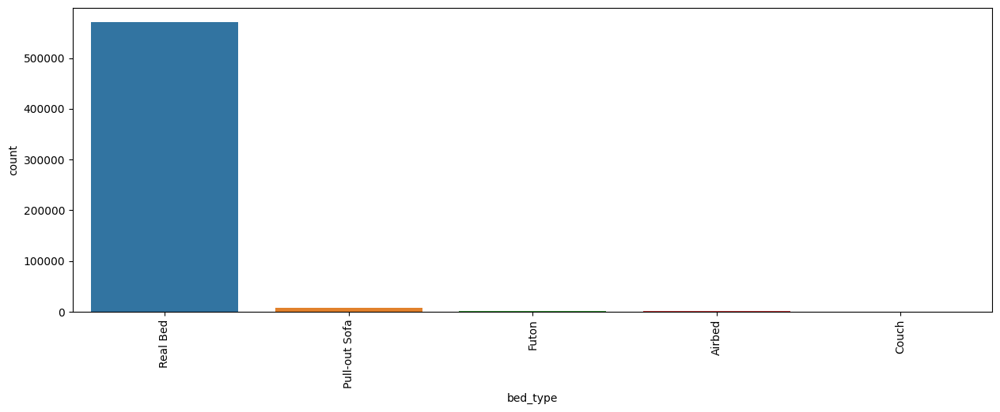

In [44]:
print(base_airbnb['bed_type'].value_counts())

plt.figure(figsize=(15,5))
grafico = sns.countplot(x='bed_type',data=base_airbnb)
grafico.tick_params(axis='x',rotation=90)

['Pull-out Sofa', 'Futon', 'Airbed', 'Couch']
Real Bed    570643
Outros       11340
Name: bed_type, dtype: int64


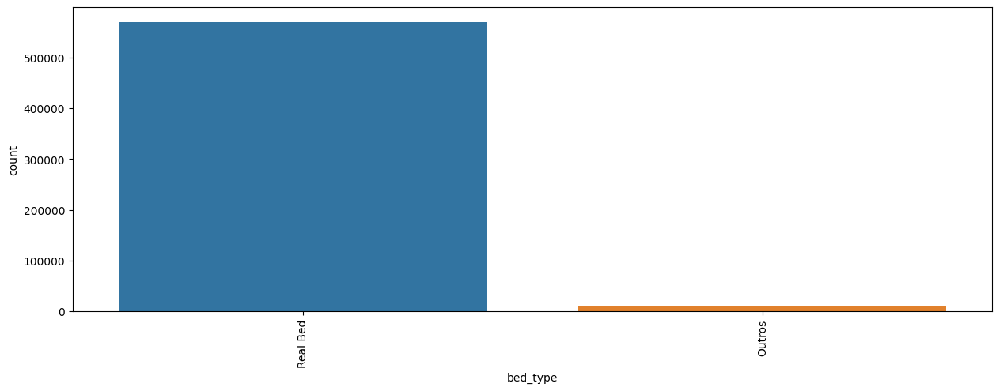

In [45]:
# agrupando categorias
tabela_bed = base_airbnb['bed_type'].value_counts()

colunas_agrupar = []
for tipo in tabela_bed.index:
    if tabela_bed[tipo] < 10000:
        colunas_agrupar.append(tipo)
print(colunas_agrupar) # lista que vamos considerar 'Outros'

for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['bed_type']==tipo,'bed_type'] = 'Outros'

print(base_airbnb['bed_type'].value_counts())
plt.figure(figsize=(15,5))
grafico = sns.countplot(x='bed_type',data=base_airbnb)
grafico.tick_params(axis='x',rotation=90)

### cancellation_policy

flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9696
super_strict_60                   135
super_strict_30                    32
Name: cancellation_policy, dtype: int64


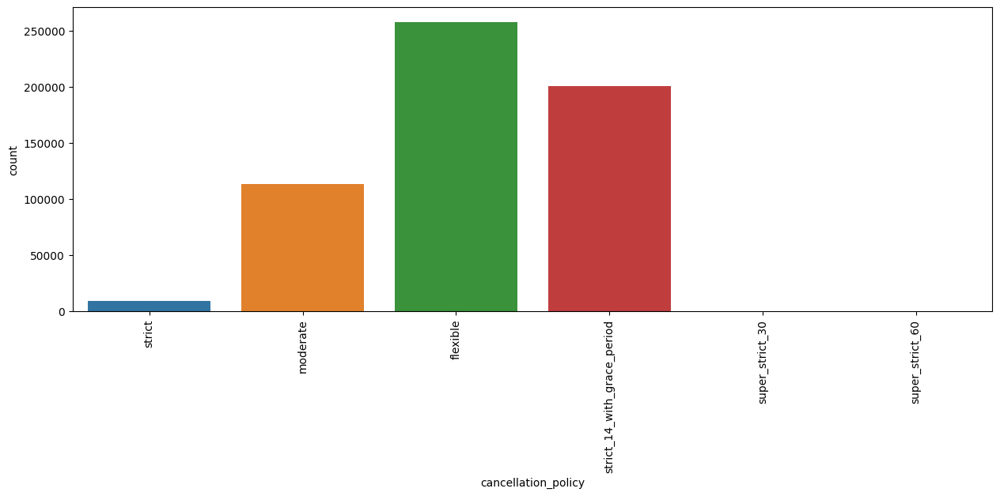

In [46]:
print(base_airbnb['cancellation_policy'].value_counts())

plt.figure(figsize=(15,5))
grafico = sns.countplot(x='cancellation_policy',data=base_airbnb)
grafico.tick_params(axis='x',rotation=90)

['strict', 'super_strict_60', 'super_strict_30']
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
Outros                           9863
Name: cancellation_policy, dtype: int64


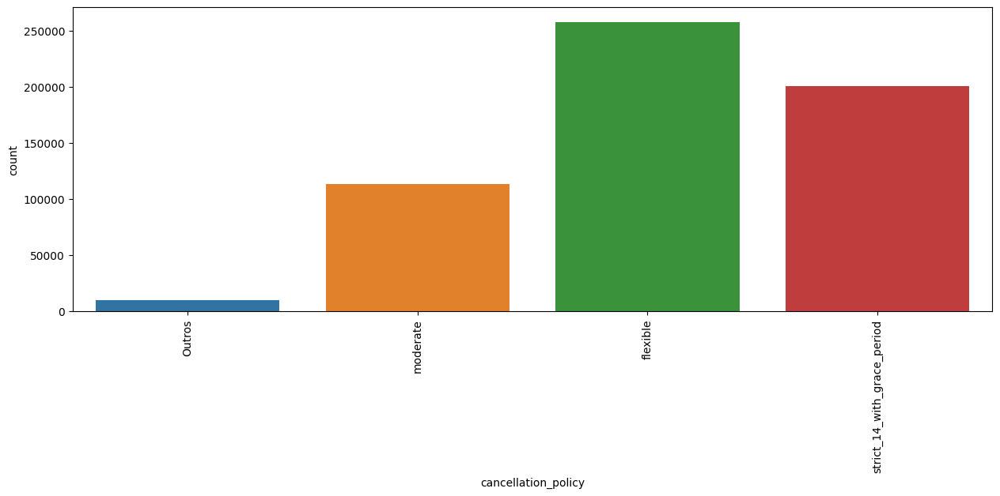

In [47]:
# agrupando categorias
tabela_cancelation = base_airbnb['cancellation_policy'].value_counts()

colunas_agrupar = []
for tipo in tabela_cancelation.index:
    if tabela_cancelation[tipo] < 10000:
        colunas_agrupar.append(tipo)
print(colunas_agrupar) # lista que vamos considerar 'Outros'

for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['cancellation_policy']==tipo,'cancellation_policy'] = 'Outros'

print(base_airbnb['cancellation_policy'].value_counts())
plt.figure(figsize=(15,5))
grafico = sns.countplot(x='cancellation_policy',data=base_airbnb)
grafico.tick_params(axis='x',rotation=90)

### amenities

Problemas:
- itens podem estar escritos de formas diferentes
- algumas caracteristicas podem ser descritas e outras não pelo host
- dificil comparar características por caracteristicas

Por isso vamos avaliar a **quantidade de amenities**, pela lógica de que hosts que detalham mais os amenities podem cobrar mais caro o imóvel.

In [48]:
# checar
print(base_airbnb['amenities'].iloc[0].split(',')) # divide amenities
print(len(base_airbnb['amenities'].iloc[0].split(','))) # quantidade

['{TV', '"Cable TV"', 'Internet', 'Wifi', '"Air conditioning"', 'Kitchen', '"Paid parking off premises"', '"Smoking allowed"', 'Doorman', 'Elevator', '"Hot tub"', '"Family/kid friendly"', '"Suitable for events"', 'Essentials', '"24-hour check-in"', 'Hangers', '"Hair dryer"', 'Iron', '"Laptop friendly workspace"', '"Self check-in"', '"Front desk/doorperson"', '"Private entrance"', '"Hot water"', '"Bed linens"', '"Luggage dropoff allowed"}']
25


In [49]:
# criar coluna quantidade de amenities
base_airbnb['n_amenities'] = base_airbnb['amenities'].str.split(',').apply(len) 
    # coloca o str pois esta aplicando numa cluna do Pandas

# retirar coluna amenities
base_airbnb = base_airbnb.drop('amenities', axis=1)
base_airbnb.shape

(581983, 20)

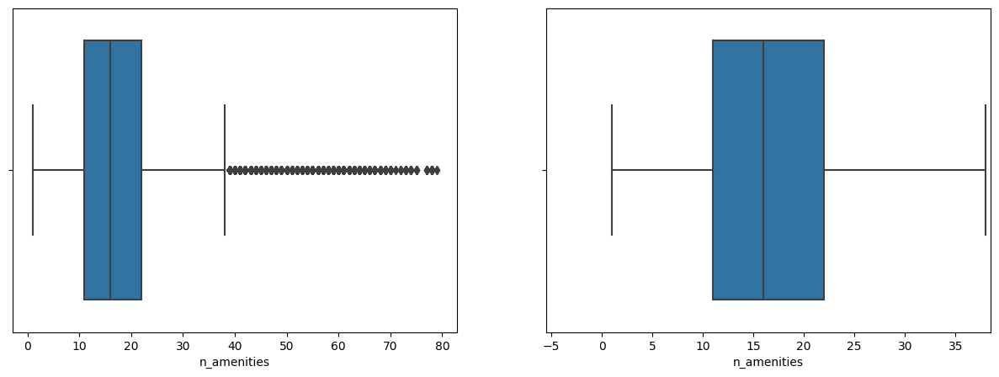

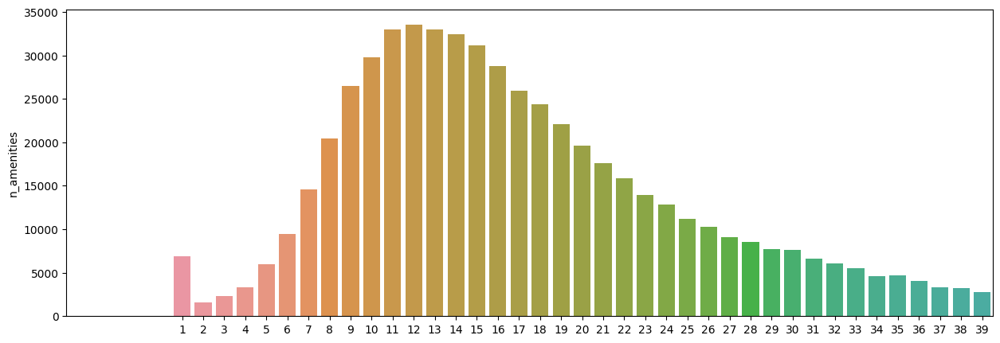

In [50]:
diagrama_caixa(base_airbnb['n_amenities'])
grafico_barra(base_airbnb['n_amenities'])

In [51]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb,'n_amenities')
print('{} linhas removidas'.format(linhas_removidas))

24343 linhas removidas


### Visualização de mapa

In [52]:
amostra = base_airbnb.sample(n=50000)
centro_mapa = {'lat':amostra.latitude.mean(), 'lon':amostra.longitude.mean()}
mapa = px.density_mapbox(amostra, lat='latitude', lon='longitude',z='price', radius=2.5,
                        center=centro_mapa, zoom=10,
                        mapbox_style='stamen-terrain')
mapa.show()

### Encoding

Precisamor ajustar as features (de categoria, true e false, etc.) para facilitar o trabalho do modelo futuro (que não trabalham com variáveis de texto)

- Features de Valores True ou False, vamos substituir True por 1 e False por 0.
- Features de Categoria (features em que os valores da coluna são textos) vamos utilizar o método de encoding de variáveis dummies

In [53]:
colunas_tf = ['host_is_superhost', 'instant_bookable', 'is_business_travel_ready']

base_airbnb_cod = base_airbnb.copy()
for coluna in colunas_tf:
    base_airbnb_cod.loc[base_airbnb_cod[coluna]=='t', coluna] = 1
    base_airbnb_cod.loc[base_airbnb_cod[coluna]=='f', coluna] = 0

print(base_airbnb_cod.iloc[0])

host_is_superhost                         1
host_listings_count                     2.0
latitude                         -22.965919
longitude                        -43.178962
property_type                   Condominium
room_type                   Entire home/apt
accommodates                              5
bathrooms                               1.0
bedrooms                                2.0
beds                                    2.0
bed_type                           Real Bed
price                                 270.0
extra_people                           51.0
minimum_nights                            4
instant_bookable                          1
is_business_travel_ready                  0
cancellation_policy                  Outros
ano                                    2018
mes                                       4
n_amenities                              25
Name: 1, dtype: object


In [54]:
# dummies
colunas_categorias = ['property_type', 'room_type', 'bed_type', 'cancellation_policy']
base_airbnb_cod = pd.get_dummies(data=base_airbnb_cod, columns=colunas_categorias)
display(base_airbnb_cod.head())

,host_is_superhost,host_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,extra_people,...,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,bed_type_Outros,bed_type_Real Bed,cancellation_policy_Outros,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_strict_14_with_grace_period
1,1,2.0,-22.965919,-43.178962,5,1.0,2.0,2.0,270.0,51.0,...,1,0,0,0,0,1,1,0,0,0
3,0,3.0,-22.977117,-43.190454,3,1.0,1.0,2.0,161.0,45.0,...,1,0,0,0,0,1,1,0,0,0
4,1,1.0,-22.983024,-43.214270,3,1.0,1.0,2.0,222.0,68.0,...,1,0,0,0,0,1,1,0,0,0
5,1,1.0,-22.988165,-43.193588,3,1.5,1.0,2.0,308.0,86.0,...,1,0,0,0,0,1,1,0,0,0
6,1,1.0,-22.981269,-43.190457,2,1.0,1.0,2.0,219.0,80.0,...,1,0,0,0,0,1,1,0,0,0


### Modelo de Previsão

- Métricas de avaliação

In [55]:
def avaliar_modelo(nome_modelo, y_teste, previsao): # y_teste = valores reais
    r2 = r2_score(y_teste, previsao)
    RSME = np.sqrt(mean_squared_error(y_teste, previsao))
    return f'Modelo {nome_modelo}:\nR²:{r2:.2%}\nRSME:{RSME:.2f}'

- Escolha dos modelos a serem testados
    1. RandomForest
    2. LinearRegression
    3. ExtraTrees

In [56]:
modelo_rf = RandomForestRegressor()
modelo_lr = LinearRegression()
modelo_et = ExtraTreesRegressor()

modelos = {'RandomForest': modelo_rf,
          'LinearRegression': modelo_lr,
          'ExtraTrees': modelo_et,
          }

- Definir Y e X

In [57]:
y = base_airbnb_cod['price']
X = base_airbnb_cod.drop('price', axis=1)

- Separar dados em treino e teste + treino do modelo

In [58]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

for nome_modelo, modelo in modelos.items():
    # treinar
    modelo.fit(X_train, y_train)
    # testar
    previsao = modelo.predict(X_test)
    print(avaliar_modelo(nome_modelo, y_test, previsao))

Modelo RandomForest:
R²:97.23%
RSME:44.12
Modelo LinearRegression:
R²:32.70%
RSME:217.54
Modelo ExtraTrees:
R²:97.51%
RSME:41.88


### Análise do Melhor Modelo

Melhor modelo: **ExtraTreesRegressor**

[0.01358554 0.0396211  0.10388274 0.10105328 0.0742345  0.065861
 0.11924966 0.05292245 0.08611553 0.06537692 0.02214623 0.
 0.0113145  0.00469564 0.08913156 0.01279923 0.00131349 0.0051973
 0.00065732 0.00091783 0.0006466  0.00710082 0.00214239 0.00235858
 0.00226847 0.0634593  0.00030932 0.00415809 0.00192803 0.00267498
 0.00265786 0.00084627 0.01950334 0.01206256 0.00780754]
Index(['host_is_superhost', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'extra_people',
       'minimum_nights', 'instant_bookable', 'is_business_travel_ready', 'ano',
       'mes', 'n_amenities', 'property_type_Apartment',
       'property_type_Bed and breakfast', 'property_type_Condominium',
       'property_type_Guest suite', 'property_type_Guesthouse',
       'property_type_Hostel', 'property_type_House', 'property_type_Loft',
       'property_type_Outros', 'property_type_Serviced apartment',
       'room_type_Entire home/apt', 'room_type_Hotel room

,0
bedrooms,0.119250
latitude,0.103883
longitude,0.101053
n_amenities,0.089132
extra_people,0.086116
accommodates,0.074234
bathrooms,0.065861
minimum_nights,0.065377
room_type_Entire home/apt,0.063459
beds,0.052922


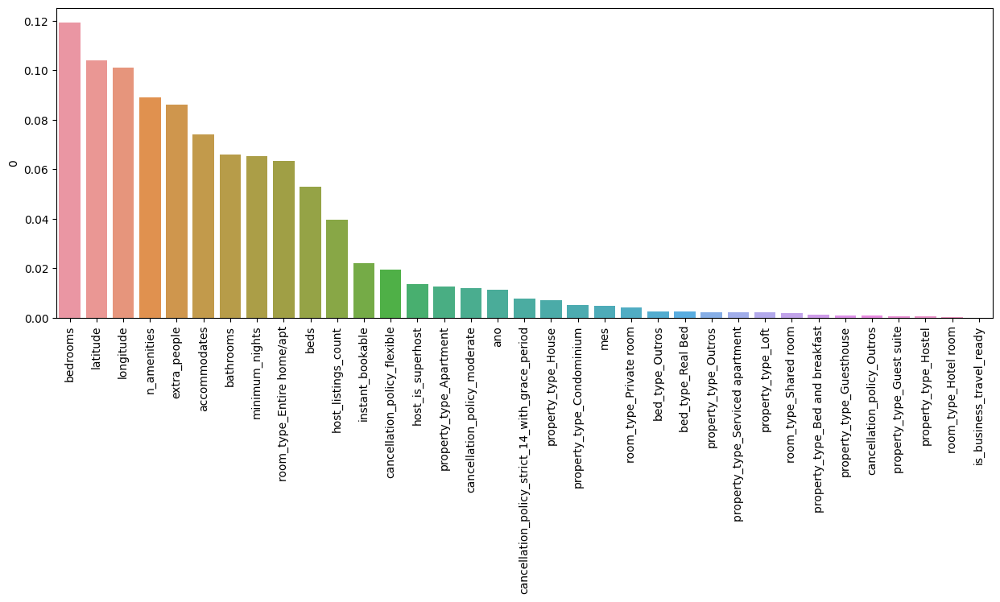

In [59]:
print(modelo_et.feature_importances_)
print(X_train.columns)

importancia_features = pd.DataFrame(data=modelo_et.feature_importances_,
                                   index=X_train.columns)
importancia_features = importancia_features.sort_values(by=0,ascending=False)
display(importancia_features)

plt.figure(figsize=(15,5))
ax = sns.barplot(x=importancia_features.index, y=importancia_features[0])
ax.tick_params(axis='x',rotation=90)

### Ajustes e Melhorias no Melhor Modelo

- is_business_travel_ready parece nao ter muito impacto
- vamos excluir e testar o melhor modelo sem essa coluna

In [60]:
# base
base_airbnb_cod = base_airbnb_cod.drop('is_business_travel_ready',axis=1)

# definir x e y
y = base_airbnb_cod['price']
X = base_airbnb_cod.drop('price', axis=1)

# definir train e test
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

# treinar
modelo_et.fit(X_train, y_train)
# testar
previsao = modelo_et.predict(X_test)
print(avaliar_modelo('ExtraTrees', y_test, previsao))

Modelo ExtraTrees:
R²:97.52%
RSME:41.80


Modelo sem 'is_business_travel_ready' ficou melhor

Vamos agora excluir colunas de bed_type (2 colunas)

In [61]:
# base
base_teste = base_airbnb_cod.copy()
for coluna in base_teste:
    if 'bed_type' in coluna:
        base_teste = base_teste.drop(coluna,axis=1)

# definir x e y
y = base_teste['price']
X = base_teste.drop('price', axis=1)

# definir train e test
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

# treinar
modelo_et.fit(X_train, y_train)
# testar
previsao = modelo_et.predict(X_test)
print(avaliar_modelo('ExtraTrees', y_test, previsao))

Modelo ExtraTrees:
R²:97.49%
RSME:41.98


Modelo sem colunas de bed_type ficou levemente 'pior', mas em compensação está mais simplificado (menos variáveis)

Vamos manter esse como o modelo final

### Deploy do projeto

- Passo 1 -> Criar arquivo do Modelo (joblib)<br>
- Passo 2 -> Escolher a forma de deploy:
    - Arquivo Executável + Tkinter
    - Deploy em Microsite (Flask)
    - Deploy apenas para uso direto Streamlit
- Passo 3 -> Outro arquivo Python (pode ser Jupyter ou PyCharm)
- Passo 4 -> Importar streamlit e criar código
- Passo 5 -> Atribuir ao botão o carregamento do modelo
- Passo 6 -> Deploy feito

In [62]:
X['price'] = y
X.to_csv('dados.csv')

In [63]:
import joblib
joblib.dump(modelo_et, 'modelo.joblib') 

['modelo.joblib']